<a href="https://colab.research.google.com/github/ash11sh/opencv-notes/blob/master/learn_opencv_part2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## pixel value stats

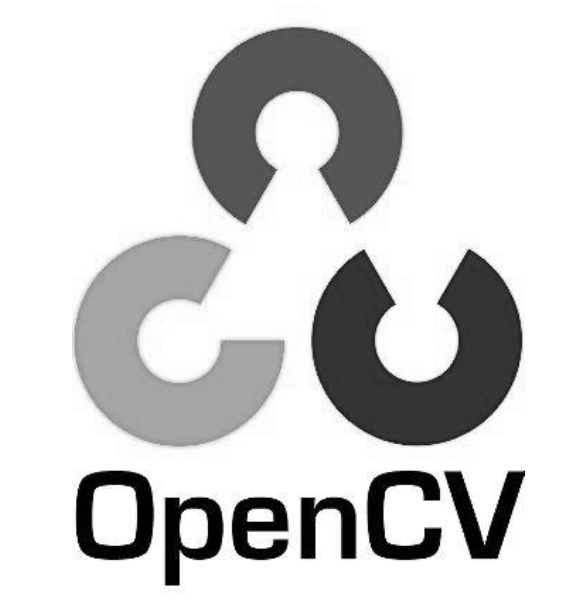

In [70]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

src = cv2.imread('test.png', cv2.IMREAD_GRAYSCALE)
cv2_imshow(src)

In [71]:
min,max, minLoc, maxLoc = cv2.minMaxLoc(src)
print("min: %.2f, max: %2f" %(min,max))
print("min loc: ",minLoc)
print("max loc:", maxLoc)

min: 0.00, max: 255.000000
min loc:  (112, 471)
max loc: (0, 0)


mean: 208.89, stddev: 79.72


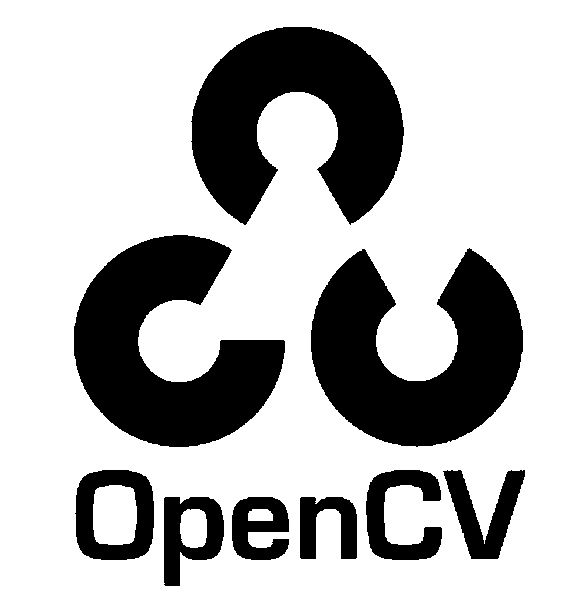

In [72]:
means, stddev = cv2.meanStdDev(src)
print("mean: %.2f, stddev: %.2f" % (means, stddev))
src[np.where(src < means)] = 0
src[np.where(src > means)] = 255
cv2_imshow(src)

## pixel normalization

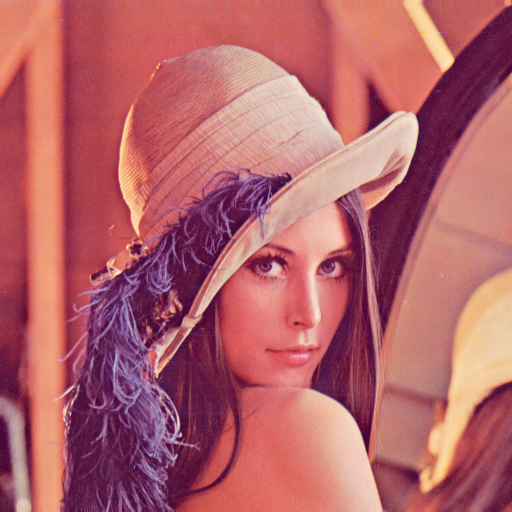

In [73]:
src = cv2.imread('test01.png')
cv2_imshow(src)


In [74]:
gray = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)

# Convert to an float type array
gray = np.float32(gray)
print (gray)




[[162. 162. 162. ... 170. 155. 128.]
 [162. 162. 162. ... 170. 155. 128.]
 [162. 162. 162. ... 170. 155. 128.]
 ...
 [ 43.  43.  50. ... 104. 100.  98.]
 [ 44.  44.  55. ... 104. 105. 108.]
 [ 44.  44.  55. ... 104. 105. 108.]]


[[0.6227272  0.6227272  0.6227272  ... 0.6590909  0.59090906 0.4681818 ]
 [0.6227272  0.6227272  0.6227272  ... 0.6590909  0.59090906 0.4681818 ]
 [0.6227272  0.6227272  0.6227272  ... 0.6590909  0.59090906 0.4681818 ]
 ...
 [0.08181818 0.08181818 0.11363636 ... 0.35909092 0.34090906 0.33181816]
 [0.08636363 0.08636363 0.13636363 ... 0.35909092 0.36363637 0.37727273]
 [0.08636363 0.08636363 0.13636363 ... 0.35909092 0.36363637 0.37727273]]


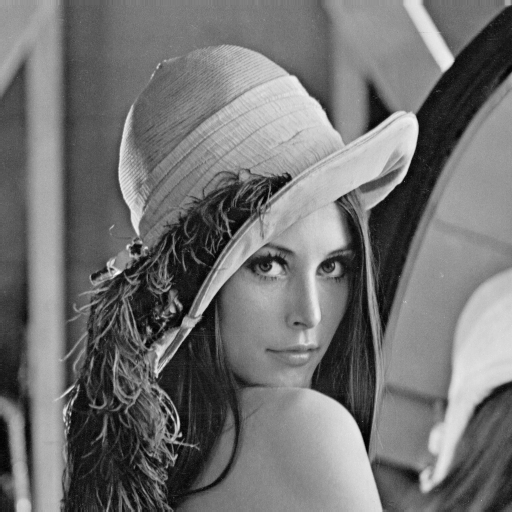

In [75]:
#scale and shift by NORM_MINMAX
dst = np.zeros(gray.shape, dtype=np.float32)
cv2.normalize(gray, dst=dst, alpha =0,beta=1.0, norm_type=cv2.NORM_MINMAX)
print(dst)
cv2_imshow(np.uint8(dst*255))

[[0.6612245  0.6612245  0.6612245  ... 0.6938775  0.63265306 0.52244896]
 [0.6612245  0.6612245  0.6612245  ... 0.6938775  0.63265306 0.52244896]
 [0.6612245  0.6612245  0.6612245  ... 0.6938775  0.63265306 0.52244896]
 ...
 [0.1755102  0.1755102  0.20408162 ... 0.42448977 0.40816325 0.39999998]
 [0.17959183 0.17959183 0.2244898  ... 0.42448977 0.4285714  0.4408163 ]
 [0.17959183 0.17959183 0.2244898  ... 0.42448977 0.4285714  0.4408163 ]]


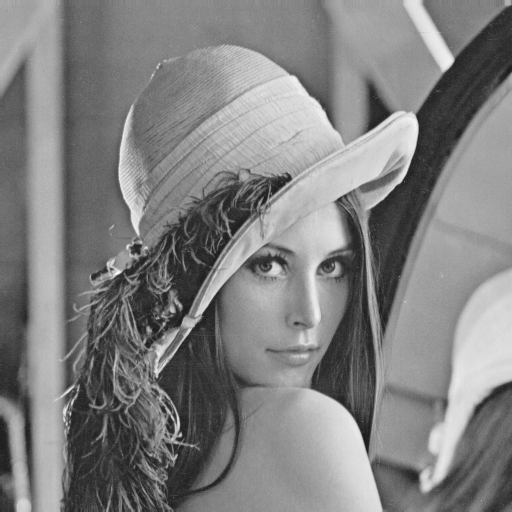

In [76]:
#scale and shift bt NORM_INF
dst = np.zeros(gray.shape, dtype=np.float32)
cv2.normalize(gray, dst=dst, alpha=1.0, beta=0, norm_type=cv2.NORM_INF)
print(dst)
cv2_imshow(np.uint8(dst*255))

[[4.9817654e-06 4.9817654e-06 4.9817654e-06 ... 5.2277787e-06
  4.7665039e-06 3.9362099e-06]
 [4.9817654e-06 4.9817654e-06 4.9817654e-06 ... 5.2277787e-06
  4.7665039e-06 3.9362099e-06]
 [4.9817654e-06 4.9817654e-06 4.9817654e-06 ... 5.2277787e-06
  4.7665039e-06 3.9362099e-06]
 ...
 [1.3223205e-06 1.3223205e-06 1.5375820e-06 ... 3.1981706e-06
  3.0751639e-06 3.0136607e-06]
 [1.3530721e-06 1.3530721e-06 1.6913401e-06 ... 3.1981706e-06
  3.2289222e-06 3.3211770e-06]
 [1.3530721e-06 1.3530721e-06 1.6913401e-06 ... 3.1981706e-06
  3.2289222e-06 3.3211770e-06]]


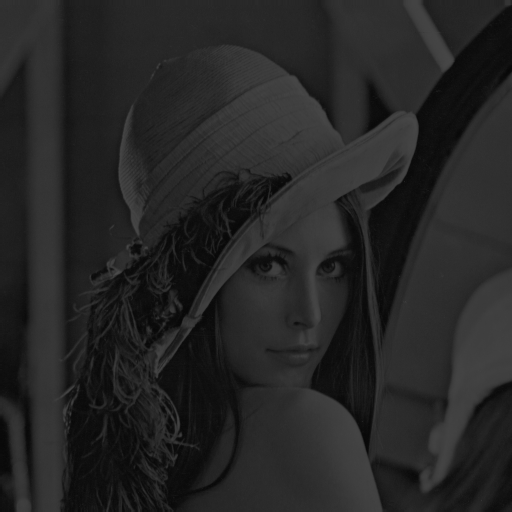

In [77]:
# scale and shift by NORM_L1
dst= np.zeros(gray.shape, dtype=np.float32)
cv2.normalize(gray,dst=dst,alpha=1.0,beta=0, norm_type= cv2.NORM_L1)
print(dst)
cv2_imshow(np.uint8(dst*10000000))

[[0.00237972 0.00237972 0.00237972 ... 0.00249724 0.0022769  0.00188028]
 [0.00237972 0.00237972 0.00237972 ... 0.00249724 0.0022769  0.00188028]
 [0.00237972 0.00237972 0.00237972 ... 0.00249724 0.0022769  0.00188028]
 ...
 [0.00063165 0.00063165 0.00073448 ... 0.00152772 0.00146897 0.00143959]
 [0.00064634 0.00064634 0.00080793 ... 0.00152772 0.00154241 0.00158648]
 [0.00064634 0.00064634 0.00080793 ... 0.00152772 0.00154241 0.00158648]]


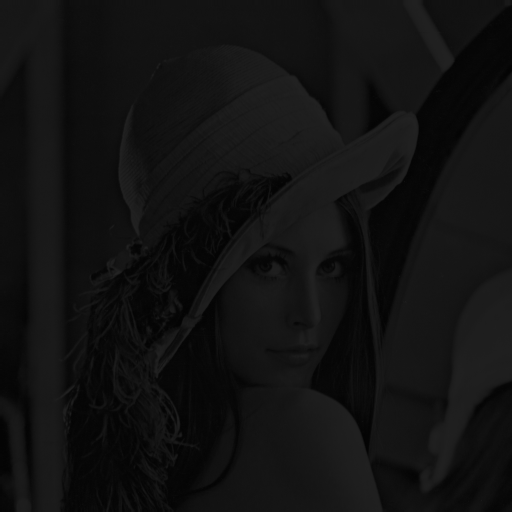

In [78]:
# scale and shift by NORM_L2
dst = np.zeros(gray.shape, dtype=np.float32)
cv2.normalize(gray,dst=dst,alpha=1.0,beta=0,norm_type=cv2.NORM_L2)
print(dst)
cv2_imshow(np.uint8(dst*10000))

## video reading & writing

In [0]:
capture = cv2.VideoCapture('test.mp4')
#capture = cv2.VideoCapture(0) #for camera

height = capture.get(cv2.CAP_PROP_FRAME_HEIGHT)
width = capture.get(cv2.CAP_PROP_FRAME_WIDTH)
count = capture.get(cv2.CAP_PROP_FRAME_COUNT)
fps = capture.get(cv2.CAP_PROP_FPS)

print(height,width,count,fps)
# out =cv2.VideoWriter('test_cp.mp4',cv2.VideoWriter_fourcc('D','I','V','X'),15, (np.int(width), np.int(height)), True))

360.0 640.0 261.0 23.663373495753802


In [0]:
out = cv2.VideoWriter("test_cp.mp4", cv2.VideoWriter_fourcc('D', 'I', 'V', 'X'), 15,
                     (np.int(width), np.int(height)), True)
while True:
    ret, frame = capture.read()
    if ret is True:
        cv2_imshow(frame)
        out.write(frame)
        c = cv2.waitKey(50)
        if c == 27: # ESC
            break
    else:
        break

capture.release()
out.release()

## image flip

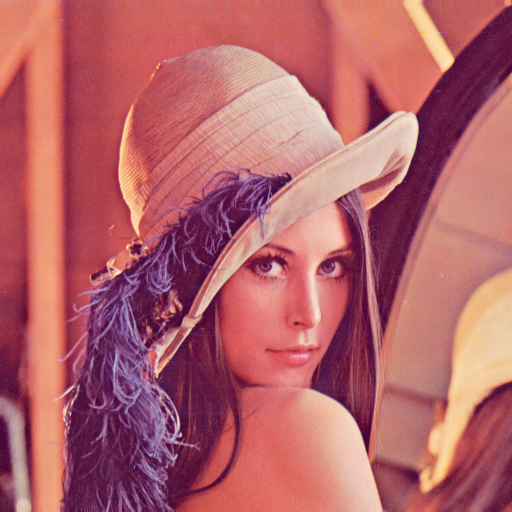

In [0]:
src =cv2.imread('test01.png')
cv2_imshow(src)

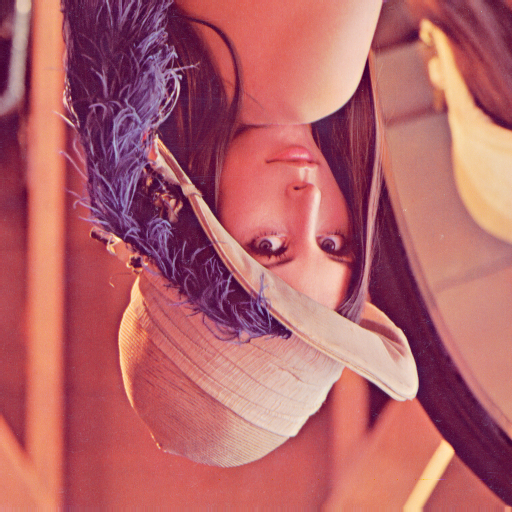

In [0]:
#X Flip reflection
dst1 = cv2.flip(src,0)
cv2_imshow(dst1)

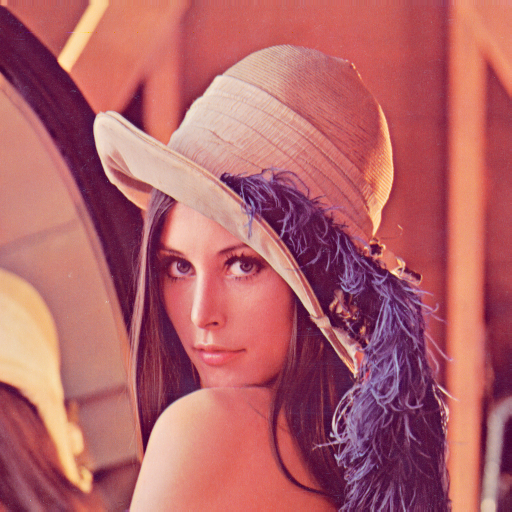

In [0]:
#y-Flip mirror
dst2= cv2.flip(src,1)
cv2_imshow(dst2)

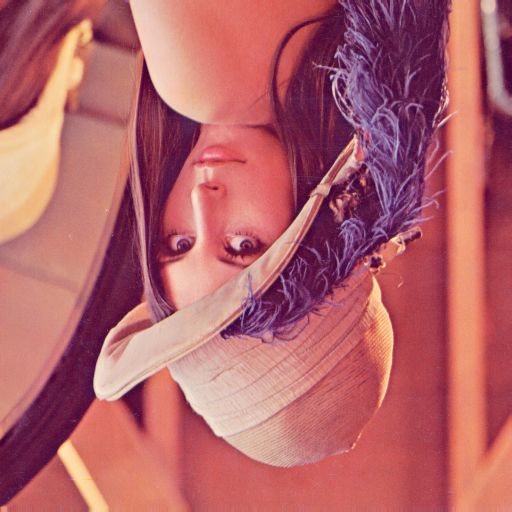

In [0]:
# XY-flip diagonal
dst3=cv2.flip(src,-1)
cv2_imshow(dst3)

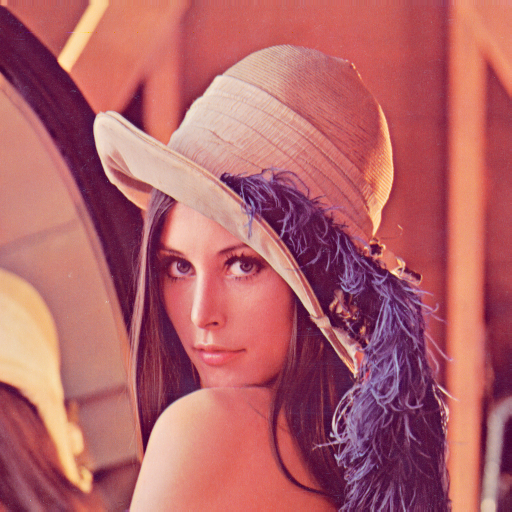

In [0]:
# custom y-flip

h,w,ch =src.shape
dst = np.zeros(src.shape, src.dtype)
for row in range(h):
  for col in range(w):
    b,g,r = src[row,col]
    dst[row,w-col-1]=[b,g,r]
cv2_imshow(dst)

## image interpolation of opencv

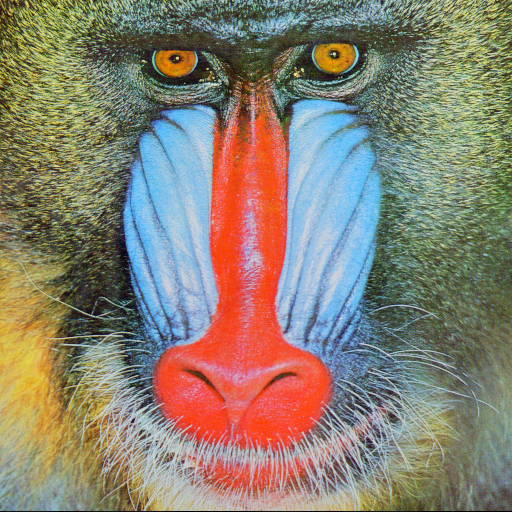

In [0]:
src = cv2.imread('baboon.png')
cv2_imshow(src)

512 512


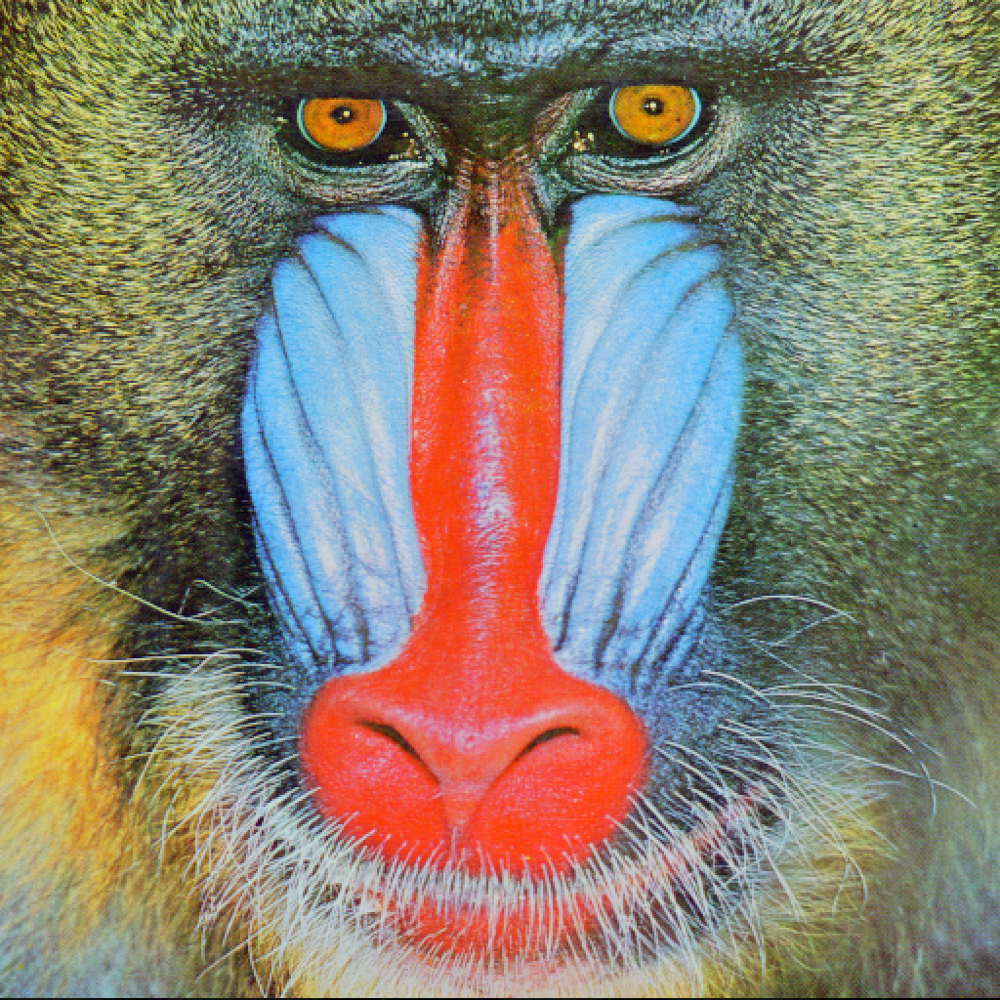

In [0]:
h,w =src.shape[:2]
print(h,w)
dst =cv2.resize(src,(w*2,h*2),fx=0.75, fy=0.75,interpolation=cv2.INTER_NEAREST)
cv2_imshow(dst)

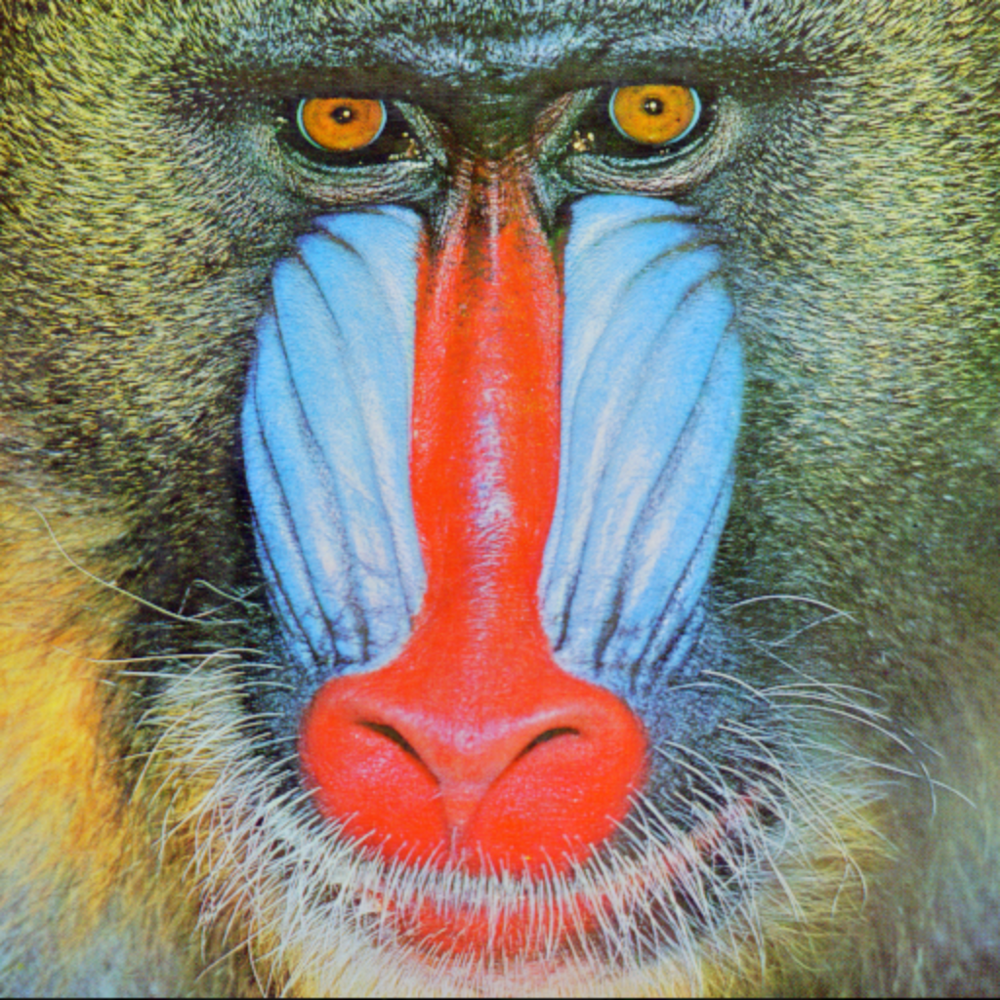

In [0]:
dst = cv2.resize(src,(w*2,h*2),interpolation=cv2.INTER_LINEAR)
cv2_imshow(dst)

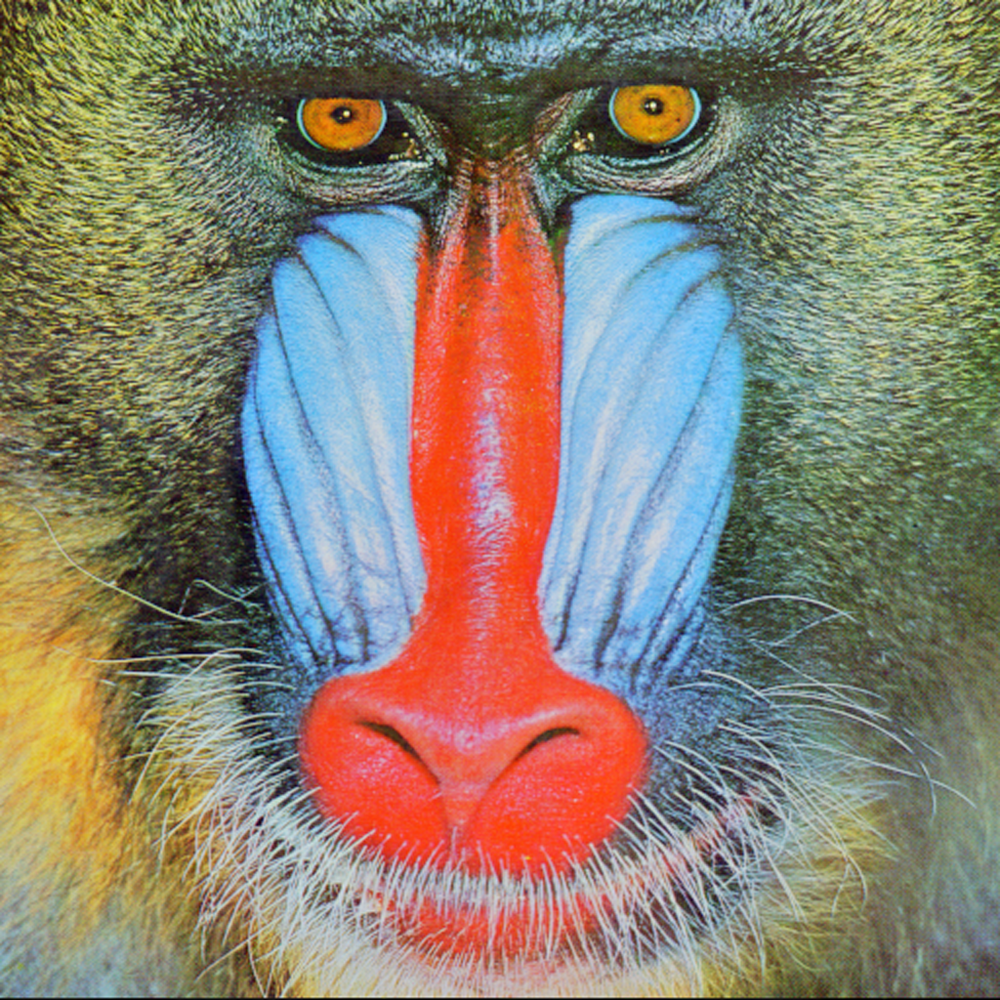

In [0]:
dst = cv2.resize(src,(w*2,h*2),interpolation=cv2.INTER_CUBIC)
cv2_imshow(dst)

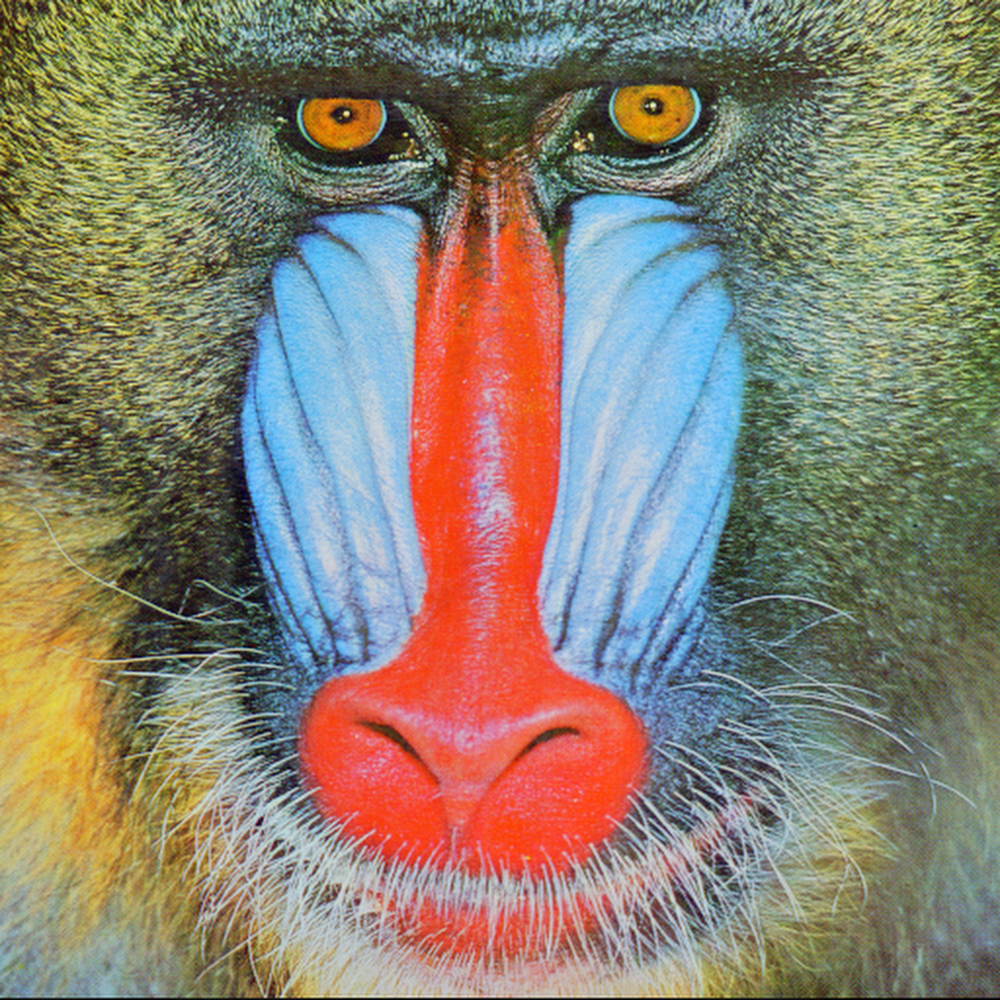

In [0]:
dst=cv2.resize(src,(w*2,h*2),interpolation=cv2.INTER_LANCZOS4)
cv2_imshow(dst)

## draw geometry

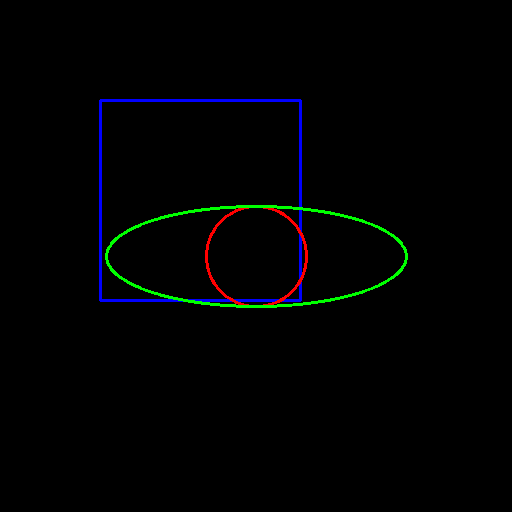

In [0]:
img = np.zeros((512,512,3),dtype=np.uint8)

cv2.rectangle(img,(100,100), (300, 300), (255, 0, 0), 2, cv2.LINE_8, 0)
cv2.circle(img, (256, 256), 50, (0, 0, 255), 2, cv2.LINE_8, 0)
cv2.ellipse(img, (256, 256), (150, 50), 360, 0, 360, (0, 255, 0), 2, cv2.LINE_8, 0)
cv2_imshow(img)

In [0]:
for i in range(100000):
  img[:,:,:] = 0
  x1 = np.random.rand() * 512
  y1 = np.random.rand() * 512
  x2 = np.random.rand() * 512
  y2 = np.random.rand() * 512

  b = np.random.randint(0, 256)
  g = np.random.randint(0, 256)
  r = np.random.randint(0, 256)
  # cv.line(image, (np.int(x1), np.int(y1)), (np.int(x2), np.int(y2)), (b, g, r), 4, cv.LINE_8, 0)
  cv2.rectangle(img, (np.int(x1), np.int(y1)), (np.int(x2), np.int(y2)), (b, g, r), 1, cv2.LINE_8, 0)
  cv2_imshow(img)
  c = cv2.waitKey(20)
  if c == 27:
      break  # ESC

cv2_imshow(img)

## image roi operations

In [0]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

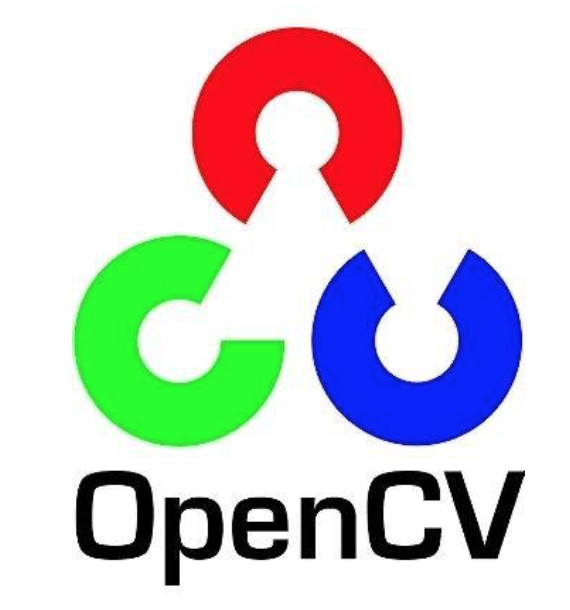

In [43]:
src =cv2.imread('test.png')
cv2_imshow(src)


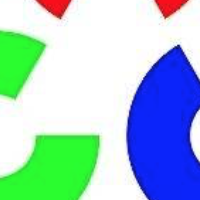

In [45]:
h,w =src.shape[:2]

#obtain ROI
cy =h//2
cx = w//2
roi = src[cy-100:cy+100,cx-100:cx+100,:]
cv2_imshow(roi)

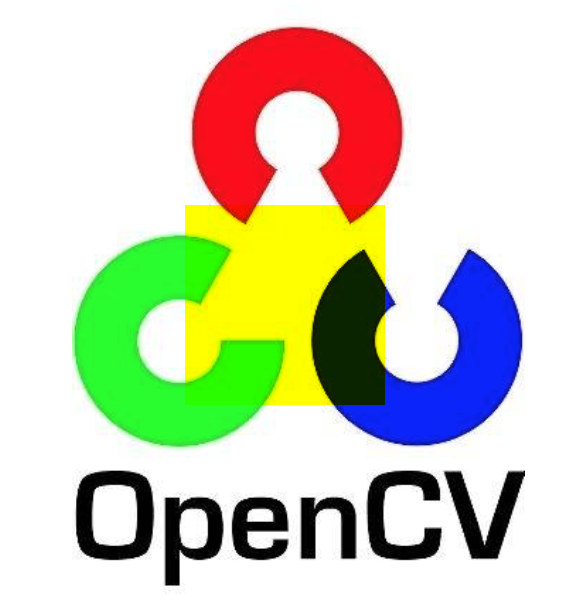

In [48]:
#copy ROI
image = np.copy(roi)

#modify ROI
roi[:, :, 0] = 0
cv2_imshow(src)

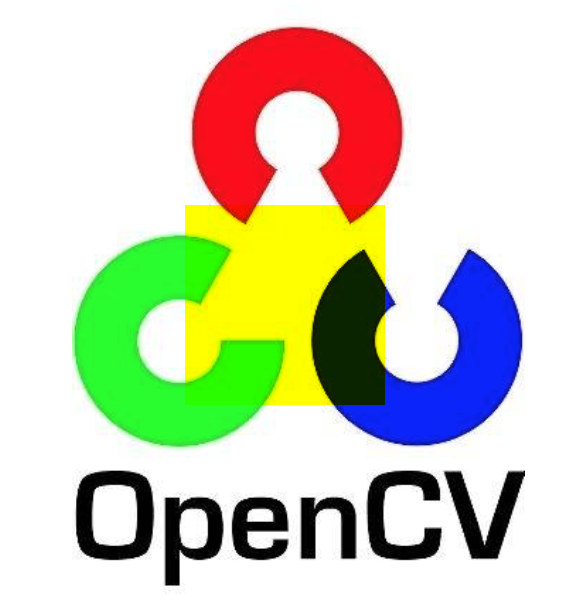

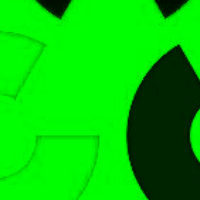

In [51]:
#modify copied ROI
image[:,:,2]=0
cv2_imshow(src)
cv2_imshow(image)


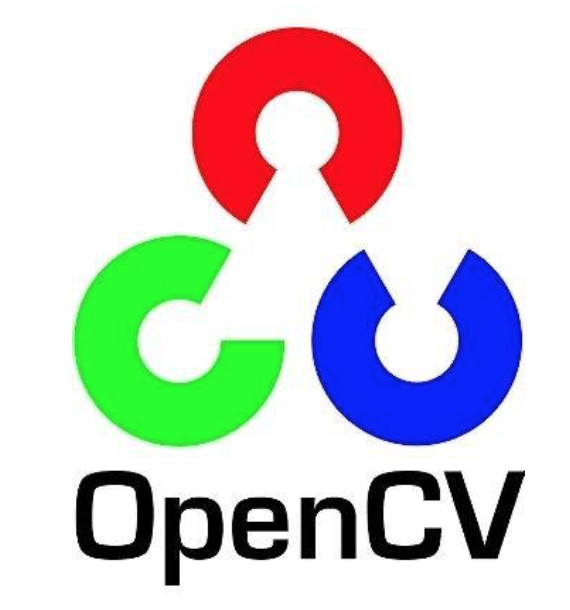

In [58]:
#ROI-generate mask
src2= cv2.imread('test.png')
cv2_imshow(src2)

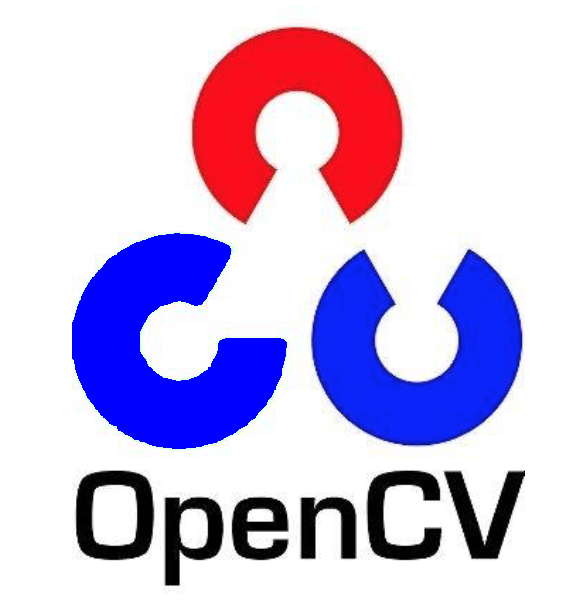

In [63]:
hsv =cv2.cvtColor(src2,cv2.COLOR_BGR2HSV)
mask=cv2.inRange(hsv,(35,43,46),(99,255,255))

#extract person ROI
mask =cv2.bitwise_not(mask)
person = cv2.bitwise_and(src2,src2,mask=mask)

#generate background
result = np.zeros(src2.shape, src2.dtype)
result[:,:,0] = 255

#combine background + person
mask = cv2.bitwise_not(mask)
dst = cv2.bitwise_or(person, result, mask=mask)
dst = cv2.add(dst,person)

cv2_imshow(dst)

## image histogram

In [0]:
import matplotlib.pyplot as plt

def custom_hist(gray):
  h,w = gray.shape
  hist = np.zeros([256],dtype=np.int32)
  for row in range(h):
    for col in range(w):
      pv = gray[row, col]
      hist[pv] +=1

  y_pos = np.arange(0,256,1,dtype = np.int32)
  plt.bar(y_pos, hist, align='center', color='r', alpha=0.5)
  plt.xticks(y_pos, y_pos)
  plt.ylabel('Frequency')
  plt.title('Histogram')
  
  plt.show()

def image_hist(image):
    cv2_imshow(image)
    color = ('blue', 'green', 'red')
    for i, color in enumerate(color):
        hist = cv2.calcHist([image], [i], None, [256], [0, 256])
        plt.plot(hist, color=color)
        plt.xlim([0, 256])
    plt.show()

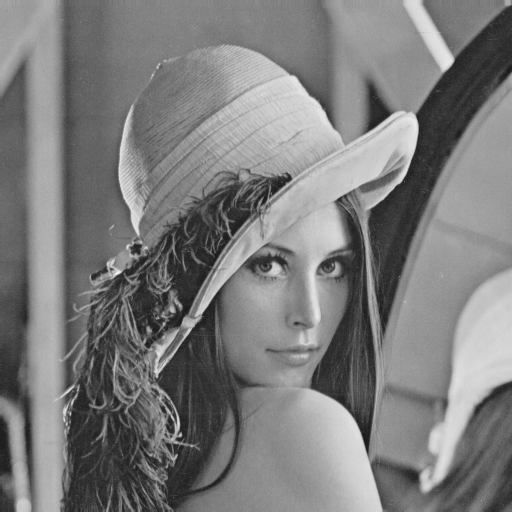

In [67]:
src= cv2.imread('test01.png')
gray = cv2.cvtColor(src,cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

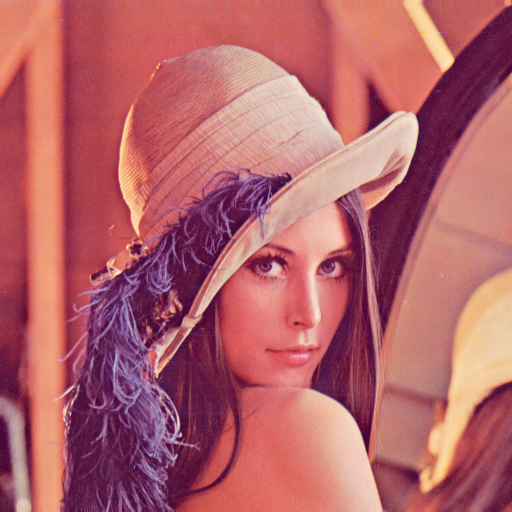

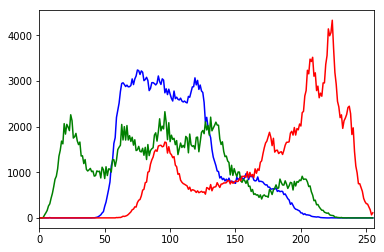

In [68]:
image_hist(src)

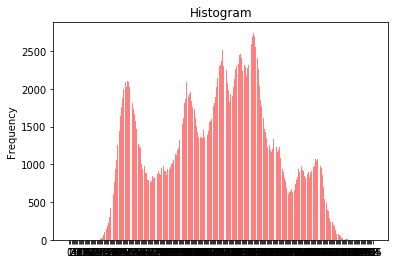

In [69]:
custom_hist(gray)